In [1]:
import matplotlib.pyplot as plt
import numpy as np
import torch
from models.NOT_SU_noinpuT import LoadNOTModel
from models.configs import LoadDataSU, NOTSU_configs, PADDING_VALUE, LoadCells, LoadSUScaler
from torch.utils.data import DataLoader
from skimage import measure
from tqdm import tqdm
import time
import pickle
import pyvista as pv
import os
device = "cuda" if torch.cuda.is_available() else "cpu"

In [17]:
# TODO: change to other backend ('html' or 'client') for intearctive plots
pv_bc = "static"  # static" #'html' 'client'
pv.set_jupyter_backend(pv_bc)
# pv.global_theme.trame.jupyter_extension_enabled = True
# pv.global_theme.trame.server_proxy_enabled = True

if pv_bc=="static":
  window_size = (1280*2, 600*2)
else:
  window_size = (1350, 800)
# window_size = (2048*2, 900*2)

In [3]:
configs = NOTSU_configs(input_T=False)
filebase = configs["filebase"]
model_args = configs["model_args"]
print(f"\n NOT SU Filebase: {filebase}, model_args:")
print(model_args)
print("\n\n model_args:")

notsu = LoadNOTModel(filebase, model_args)

SU_inverse = LoadSUScaler()


 NOT SU Filebase: /work/hdd/bdsy/qibang/repository_Wbdsy/SDFGeoDesign/models/saved_weights/NOTSU_noinpT_test, model_args:
{'img_shape': (1, 120, 120), 'channel_mutipliers': [1, 2, 4, 8], 'has_attention': [False, False, False, False], 'first_conv_channels': 8, 'num_res_blocks': 1, 'norm_groups': 8, 'dropout': None, 'embed_dim': 64, 'cross_attn_layers': 2, 'num_heads': 8, 'in_channels': 2, 'out_channels': 3, 'emd_version': 'nerf', 'padding_value': -1000, 'num_frames': 26}


 model_args:
Total number of parameters of encoder: 553776, 553776 of which are trainable
Total number of parameters of NOT model: 949630, 949630 of which are trainable


In [4]:


def cal_l2_error(y_p, y_t):
    s_p, s_t = y_p[:, :, 0], y_t[:, :, 0]
    ux_p, ux_t = y_p[:, :, 1], y_t[:, :, 1]
    uy_p, uy_t = y_p[:, :, 2], y_t[:, :, 2]
    e_s = np.linalg.norm(s_p-s_t)/np.linalg.norm(s_t)
    e_ux = np.linalg.norm(ux_p-ux_t)/np.linalg.norm(ux_t)
    e_uy = np.linalg.norm(uy_p-uy_t)/np.linalg.norm(uy_t)
    error_s = (e_s+e_ux+e_uy)/3
    return error_s



In [5]:

def predict_su_designed_geo(working_dir):
    stress_file = os.path.join(working_dir, "mises_stress.npy")
    disp_file = os.path.join(working_dir, "displacement.npy")
    mesh_file = os.path.join(working_dir, "mesh_data.npz")
    sdf_norm = np.load(os.path.join(working_dir, "sdf_norm.npy"))
    mises = np.load(stress_file)
    disp = np.load(disp_file)
    mesh = np.load(mesh_file)
    nodes = mesh['nodes_coords']
    cells = mesh['elements_connectivity']
    gap = 2
    mises = np.concatenate(
        [np.zeros_like(mises[0])[None], mises], axis=0)[::gap]  # [Nt,N] Nt:51->26
    disp = np.concatenate(
        [np.zeros_like(disp[0])[None], disp], axis=0)[::gap]
    mises = np.transpose(mises)[:, :, None]  # [Nt,N]->[N,Nt,1]
    disp = np.transpose(disp, axes=(1, 0, 2))  # [Nt,N,2]->[N,Nt,2]
    su_true = np.concatenate(
        [mises, disp], axis=-1, dtype=np.float32)  # [N,Nt,3]

    xy = torch.tensor(nodes[None, :, :2], dtype=torch.float32).to(device)
    sdf_norm = torch.tensor(sdf_norm[None, :], dtype=torch.float32).to(device)

    pred = notsu(xy, sdf_norm)
    pred = SU_inverse(pred)
    pred = pred.cpu().detach().numpy().squeeze()
    error_s = cal_l2_error(pred, su_true)
    print(f"L2 Relative Error of the test sample: {error_s}")
    return pred, su_true, cells, nodes[:, :2]

In [ ]:
def get_pvstyle_cells(cells_np):
    """cells_np is a numpy array of shape (N, 4)"""
    cell_types = np.zeros(len(cells_np), dtype=int)
    cells = np.empty((0,), dtype=int)
    for i, c in enumerate(cells_np):
        c = c-1  # abaqus uses 1-based index
        if c[-1] == c[-2]:
            cell_types[i] = pv.CellType.TRIANGLE
            cells = np.append(cells, np.array([3, *(c[:-1])]))
        else:
            cell_types[i] = pv.CellType.QUAD
            cells = np.append(cells, np.array([4, *c]))
    return cells, cell_types


def plot_results(su_true, su_pred, cells_np, verts,
                 label="Mises stress [MPa]", opacity=1.0,
                 cmap="viridis", pc_color='green', point_size=8.0,
                 notebook=None, show_edges=True,
                 html_file=None, window_size=(1024, 256)):
    """
    su_true: (N,8,3)
    """
    Nt = su_true.shape[1]
    max_s, min_s = np.max(su_true[:, -1, 0]), np.min(su_true[:, -1, 0])
    error_s = np.abs(su_true[:, -1, 0]-su_pred[:, -1, 0])
    max_e, min_e = np.max(error_s), np.min(error_s)
    cells, cell_types = get_pvstyle_cells(cells_np)
    plotter = pv.Plotter(shape=(3, Nt), notebook=notebook,
                         window_size=window_size, border=False)
    lables_t = [f"True Mises stress [MPa] at strain = {((i)*3.2+4):.1f}%" for i in range(Nt)]
    lables_p = [f"Pred. Mises stress [MPa] at strain = {((i)*3.2+4):.1f}%" for i in range(Nt)]
    lables_e = [f"Abs. error [MPa] at strain = {((i)*3.2+4):.1f}%" for i in range(Nt)]
    for i in range(Nt):
        sigma_true, sigma_pred = su_true[:, i, 0], su_pred[:, i, 0]
        error = np.abs(sigma_true-sigma_pred)
        defomred_verts_t = verts + su_true[:, i, 1:3]
        defomred_verts_t = np.hstack(
            (defomred_verts_t, np.zeros((defomred_verts_t.shape[0], 1))))

        mesh_t = pv.UnstructuredGrid(
            cells, cell_types, defomred_verts_t)
        mesh_t.point_data[lables_t[i]] = sigma_true
        plotter.subplot(0, i)
        plotter.add_mesh(mesh_t, scalars=lables_t[i],
                         show_edges=show_edges, opacity=opacity, cmap=cmap, clim=[min_s, max_s])
        plotter.view_xy()

        defomred_verts_p = verts + su_pred[:, i, 1:3]
        defomred_verts_p = np.hstack(
            (defomred_verts_p, np.zeros((defomred_verts_p.shape[0], 1))))
        mesh_p = pv.UnstructuredGrid(
            cells, cell_types, defomred_verts_p)
        mesh_p.point_data[lables_p[i]] = sigma_pred
        plotter.subplot(1, i)
        plotter.add_mesh(mesh_p, scalars=lables_p[i],
                         show_edges=show_edges, opacity=opacity,
                         cmap=cmap, clim=[min_s, max_s])
        plotter.view_xy()

        mesh_e = pv.UnstructuredGrid(
            cells, cell_types, defomred_verts_t)
        mesh_e.point_data[lables_e[i]] = error
        plotter.subplot(2, i)
        plotter.add_mesh(mesh_e, scalars=lables_e[i],
                         show_edges=show_edges, opacity=opacity, cmap=cmap, clim=[min_e, max_e])
        plotter.view_xy()

    plotter.show()

def plot_results_animation(file_name, su_true, su_pred, cells_np, verts,
                           label="Mises stress [MPa]", opacity=1.0,
                           cmap="viridis", fps=10,
                           notebook=None, show_edges=True,
                           window_size=(2048, 768)):
    """
    su_true: (N,Nt,3)
    """
    cells, cell_types = get_pvstyle_cells(cells_np)

    Nt = su_true.shape[1]
    max_s, min_s = np.max(su_true[:, -1, 0]), np.min(su_true[:, -1, 0])
    error_s = np.abs(su_true[:, -1, 0]-su_pred[:, -1, 0])
    max_e, min_e = np.max(error_s), np.min(error_s)

    plotter = pv.Plotter(shape=(1, 3), notebook=notebook,
                         window_size=window_size, border=False)
    text_actor = plotter.add_text(
        "strain = 0", position='upper_left', font_size=20)

    # Open a mv file
    extnsion = file_name.split('.', 1)[-1]
    if extnsion == 'gif':
        plotter.open_gif(file_name, fps=fps)
    else:
        plotter.open_movie(file_name, framerate=fps)
        # plotter.show(auto_close=False)

    lables_t = "True Mises stress [MPa]"
    lables_p = "Pred. Mises stress [MPa]"
    lables_e = "Abs. error [MPa]"
    i = 0
    sigma_true, sigma_pred = su_true[:, i, 0], su_pred[:, i, 0]
    error = np.abs(sigma_true-sigma_pred)

    defomred_verts_t = verts + su_true[:, i, 1:3]
    defomred_verts_t = np.hstack(
        (defomred_verts_t, np.zeros((defomred_verts_t.shape[0], 1))))
    mesh_t = pv.UnstructuredGrid(
        cells, cell_types, defomred_verts_t)
    mesh_t[lables_t] = sigma_true
    plotter.subplot(0, 0)
    plotter.add_mesh(mesh_t, scalars=lables_t,
                     show_edges=show_edges, opacity=opacity, cmap=cmap, clim=[min_s, max_s])
    plotter.view_xy()

    defomred_verts_p = verts + su_pred[:, i, 1:3]
    defomred_verts_p = np.hstack(
        (defomred_verts_p, np.zeros((defomred_verts_p.shape[0], 1))))
    mesh_p = pv.UnstructuredGrid(
        cells, cell_types, defomred_verts_p)
    mesh_p[lables_p] = sigma_pred
    plotter.subplot(0, 1)
    plotter.add_mesh(mesh_p, scalars=lables_p,
                     show_edges=show_edges, opacity=opacity,
                     cmap=cmap, clim=[min_s, max_s])
    plotter.view_xy()

    mesh_e = pv.UnstructuredGrid(
        cells, cell_types, defomred_verts_t)
    mesh_e[lables_e] = error
    plotter.subplot(0, 2)
    plotter.add_mesh(mesh_e, scalars=lables_e,
                     show_edges=show_edges, opacity=opacity, cmap=cmap, clim=[min_e, max_e])
    plotter.view_xy()

    plotter.write_frame()

    for i in range(1, Nt):
        text_actor.set_text('upper_left', f"strain = {i*0.8:.1f}%")
        sigma_true, sigma_pred = su_true[:, i, 0], su_pred[:, i, 0]
        error = np.abs(sigma_true-sigma_pred)

        defomred_verts_t = verts + su_true[:, i, 1:3]
        defomred_verts_t = np.hstack(
            (defomred_verts_t, np.zeros((defomred_verts_t.shape[0], 1))))

        defomred_verts_p = verts + su_pred[:, i, 1:3]
        defomred_verts_p = np.hstack(
            (defomred_verts_p, np.zeros((defomred_verts_p.shape[0], 1))))

        mesh_t[lables_t] = sigma_true
        mesh_t.points = defomred_verts_t
        mesh_p[lables_p] = sigma_pred
        mesh_p.points = defomred_verts_p
        mesh_e[lables_e] = error
        mesh_e.points = defomred_verts_t

        plotter.write_frame()
    # Be sure to close the plotter when finished
    plotter.close()

L2 Relative Error of the test sample: 0.17727442582448324


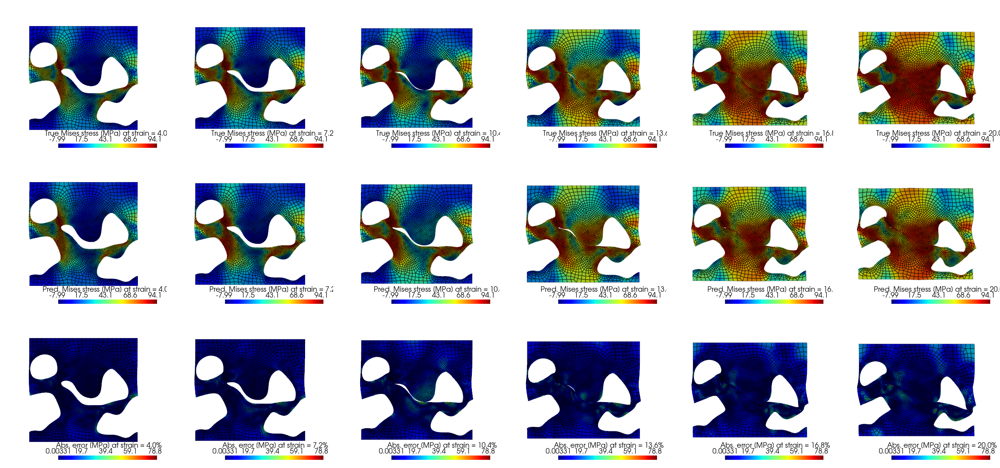

In [ ]:
working_dir = "./abaqus_sims/testID2897/d"

su_pred, su_true, cells, verts = predict_su_designed_geo(working_dir)
pred_plot = su_pred[:, 5::4]
true_plot = su_true[:, 5::4]
plot_results(true_plot, pred_plot, cells,
             verts, cmap="jet", show_edges=True, notebook=True, html_file=None, window_size=window_size)




L2 Relative Error of the test sample: 0.09518631299336751


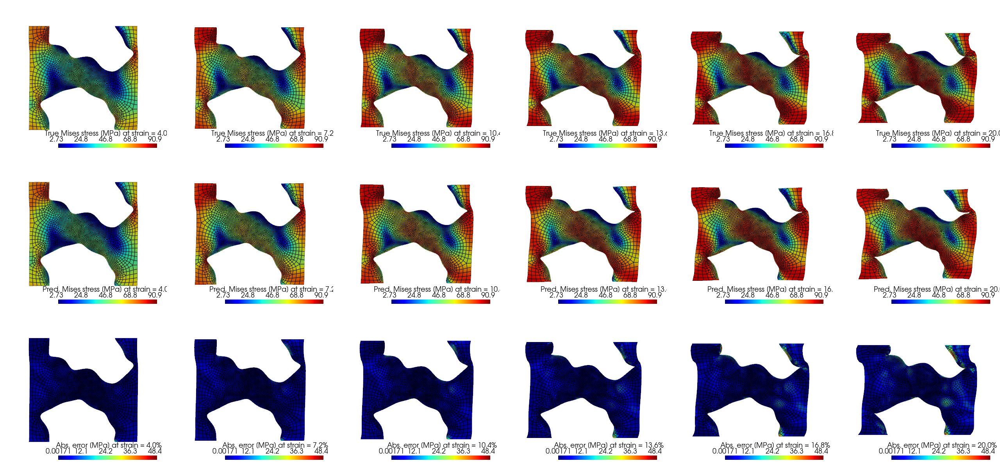

In [ ]:
working_dir = "./abaqus_sims/testID9376/f"

su_pred, su_true, cells, verts = predict_su_designed_geo(working_dir)
pred_plot = su_pred[:, 5::4]
true_plot = su_true[:, 5::4]
plot_results(true_plot, pred_plot, cells,
             verts, cmap="jet", show_edges=True, notebook=True, html_file=None, window_size=window_size)


L2 Relative Error of the test sample: 0.13950148224830627


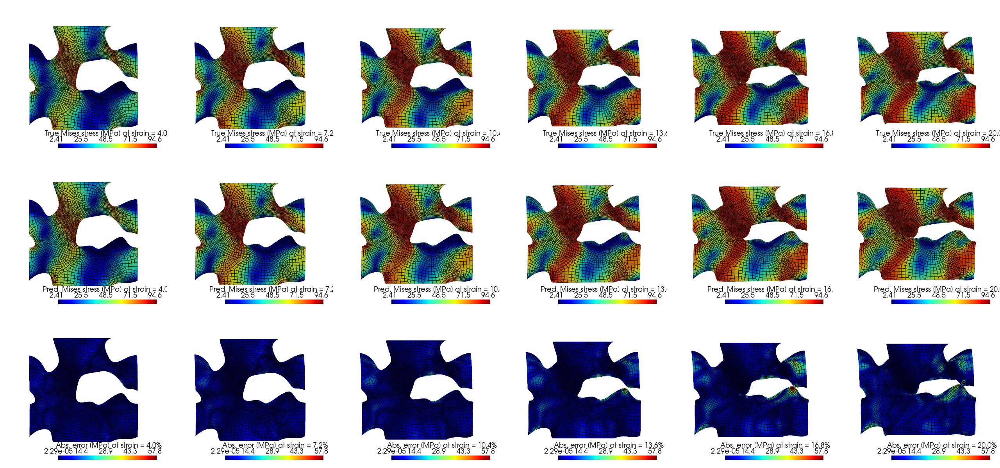

In [ ]:
working_dir = "./abaqus_sims/ondemand_case1/e"

su_pred, su_true, cells, verts = predict_su_designed_geo(working_dir)
pred_plot = su_pred[:, 5::4]
true_plot = su_true[:, 5::4]
plot_results(true_plot, pred_plot, cells,
             verts, cmap="jet", show_edges=True, notebook=True, html_file=None, window_size=window_size)


L2 Relative Error of the test sample: 0.12738576531410217


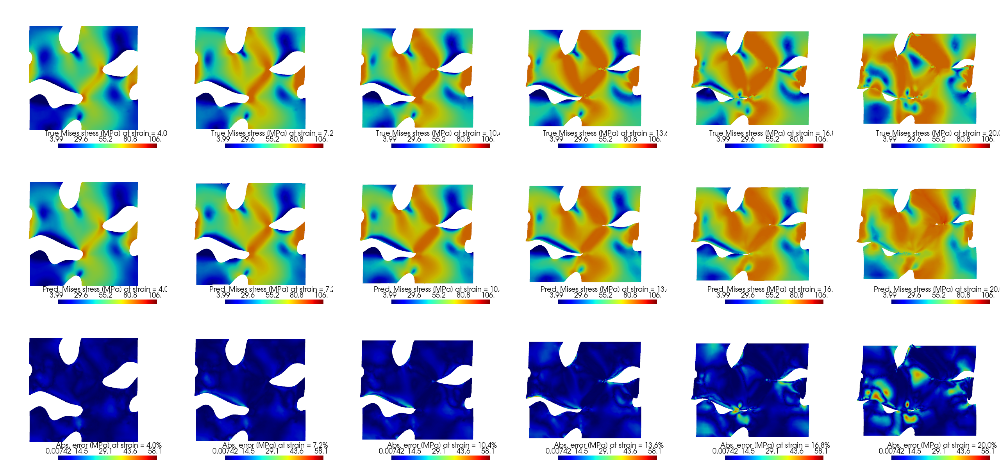

In [18]:
working_dir = "./abaqus_sims/ondemand_case2/e"

su_pred, su_true, cells, verts = predict_su_designed_geo(working_dir)
pred_plot = su_pred[:, 5::4]
true_plot = su_true[:, 5::4]
plot_results(true_plot, pred_plot, cells,
             verts, cmap="jet", show_edges=False, notebook=True, html_file=None, window_size=window_size)
if pv_bc !="static":
  file_name = "./images/caseBe.gif"
  plot_results_animation(file_name, su_true, su_pred, cells,
                      verts, cmap="jet", show_edges=True, fps=5, notebook=True, window_size=(2048, 768))